In [ ]:
!pip install kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d vipoooool/new-plant-diseases-dataset
!unzip new-plant-diseases-dataset.zip -d plant_diseases_dataset

cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory
Dataset URL: https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset
License(s): copyright-authors
 99%|██████████████████████████████████████▋| 2.68G/2.70G [00:11<00:00, 225MB/s]
100%|███████████████████████████████████████| 2.70G/2.70G [00:11<00:00, 245MB/s]
Archive:  new-plant-diseases-dataset.zip
  inflating: plant_diseases_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Apple___Apple_scab/00075aa8-d81a-4184-8541-b692b78d398a___FREC_Scab 3335.JPG  
  inflating: plant_diseases_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Apple___Apple_scab/01a66316-0e98-4d3b-a56f-d78752cd043f___FREC_Scab 3003.JPG  
  inflating: plant_diseases_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Apple___Apple_scab/01a66316-0e98-4d3b-a5

In [ ]:
!mv "/content/plant_diseases_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train" /content/plant_diseases_dataset/
!mv "/content/plant_diseases_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid" /content/plant_diseases_dataset/

DATA LOADER

In [7]:
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Conv2D, Dense, MaxPooling2D, Flatten, BatchNormalization, Dropout

In [9]:
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Conv2D, Dense, MaxPooling2D, Flatten, GlobalAveragePooling2D, BatchNormalization,Dropout
from keras.applications import VGG16, DenseNet121
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Settings
batch_size = 32
data_dir = "/kaggle/working/plant_diseases_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"

# Create training and validation datasets
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="training",
    seed=42,
    batch_size=batch_size,
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=42,
    batch_size=batch_size,
)

class_names = train_ds.class_names
num_classes = len(class_names)

test_ds = keras.utils.image_dataset_from_directory(
    directory="/kaggle/working/plant_diseases_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid",
)

# Normalize images
def normalize(image, label):
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

train_ds = train_ds.map(normalize)
val_ds = val_ds.map(normalize)
test_ds = test_ds.map(normalize)

Found 70295 files belonging to 38 classes.
Using 56236 files for training.
Found 70295 files belonging to 38 classes.
Using 14059 files for validation.
Found 17572 files belonging to 38 classes.


In [10]:
# Define a function to calculate and display metrics
def evaluate_model(model, valid_ds, model_name="Model"):
    # Initialize lists to store true labels and predicted labels
    true_classes = []
    pred_classes = []

    # Loop through the validation dataset
    for images, labels in valid_ds:
        # Store the true labels (from the dataset)
        true_classes.extend(labels.numpy())  # Convert tensor to numpy and append

        # Generate model predictions for the current batch
        predictions = model(images, training=False)  # Ensure evaluation mode
        predicted_labels = tf.argmax(predictions, axis=1)  # Get class with highest score
        pred_classes.extend(predicted_labels.numpy())  # Convert tensor to numpy and append

    # Convert lists to numpy arrays
    true_classes = np.array(true_classes)
    pred_classes = np.array(pred_classes)

    # Classification report
    class_report = classification_report(true_classes, pred_classes, target_names=class_names)
    print(f"Classification Report for {model_name}:\n", class_report)

    # Confusion matrix
    conf_matrix = confusion_matrix(true_classes, pred_classes)
    print(f"Confusion Matrix for {model_name}:")
    print(conf_matrix)

    # Plot confusion matrix (optional)
    plt.figure(figsize=(15, 10))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

ANN modelling

In [35]:
# Define and compile models as before
# ANN Model
ann_model = Sequential([
    Flatten(input_shape=(256,256, 3)),# Flatten 256x256x3 image to 1D array
    Dense(512, activation='relu'),# Fully connected layer with 512 neurons
    BatchNormalization(),
    Dropout(0.2),
    Dense(256, activation='relu'),# Fully connected layer with 256 neurons
    BatchNormalization(),
    Dropout(0.2),
    Dense(len(class_names), activation='softmax')  # Output layer
])

ann_model.summary()

ann_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),  # Lower LR for fine-tuning
    loss='sparse_categorical_crossentropy',  # Use categorical_crossentropy if labels are one-hot
    metrics=['accuracy']
)

ann_history = ann_model.fit(train_ds, validation_data=val_ds, epochs=10)



/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ flatten_9 (Flatten)                  │ (None, 196608)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 512)                 │     100,663,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_23 (Dense)                     │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_24 (Dense)                     │ (None, 38)                  │           9,766 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 100,807,974 (384.55 MB)

 Trainable params: 100,806,438 (384.55 MB)

 Non-trainable params: 1,536 (6.00 KB)

Epoch 1/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 35s 18ms/step - accuracy: 0.2730 - loss: 2.7778 - val_accuracy: 0.3041 - val_loss: 2.6698
Epoch 2/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 29s 17ms/step - accuracy: 0.3592 - loss: 2.3556 - val_accuracy: 0.4080 - val_loss: 2.1971
Epoch 3/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 29s 16ms/step - accuracy: 0.3936 - loss: 2.1790 - val_accuracy: 0.4381 - val_loss: 2.1011
Epoch 4/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 29s 16ms/step - accuracy: 0.4171 - loss: 2.0949 - val_accuracy: 0.4170 - val_loss: 2.0847
Epoch 5/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 29s 16ms/step - accuracy: 0.4626 - loss: 1.9251 - val_accuracy: 0.4845 - val_loss: 1.8320
Epoch 6/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 29s 16ms/step - accuracy: 0.4820 - loss: 1.8281 - val_accuracy: 0.4276 - val_loss: 1.9514
Epoch 7/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 29s 16ms/step - accuracy: 0.4886 - loss: 1.7905 - val_accuracy: 0.5563 - val_loss: 1.5841
Epoch 8/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 29s 16ms/step - accuracy: 0.5158 -

Classification Report for ANN:
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       0.60      0.68      0.64       504
                                 Apple___Black_rot       0.40      0.56      0.47       497
                          Apple___Cedar_apple_rust       0.75      0.26      0.39       440
                                   Apple___healthy       0.35      0.76      0.48       502
                               Blueberry___healthy       0.48      0.54      0.51       454
          Cherry_(including_sour)___Powdery_mildew       0.83      0.35      0.49       421
                 Cherry_(including_sour)___healthy       0.82      0.54      0.65       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.74      0.65      0.69       410
                       Corn_(maize)___Common_rust_       0.94      0.98      0.96       477
               Corn_(maize)___Northern_Leaf_Bli

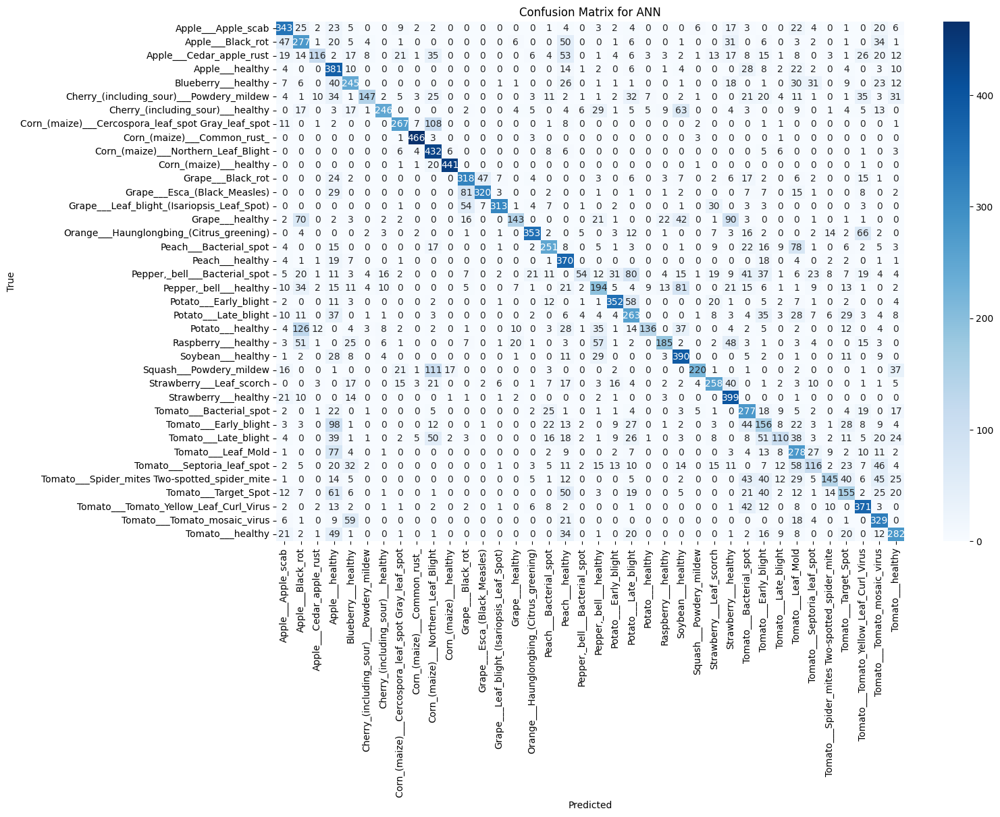

In [38]:
# Evaluate ANN model
evaluate_model(ann_model, test_ds, "ANN")

In [15]:
cnn_model = Sequential()

cnn_model.add(Conv2D(32,kernel_size=(3,3),padding='valid',activation='relu',input_shape=(256,256,3)))
cnn_model.add(BatchNormalization())
cnn_model.add(MaxPooling2D(pool_size=(2,2), strides=2, padding='valid'))

cnn_model.add(Conv2D(64,kernel_size=(3,3),padding='valid',activation='relu'))
cnn_model.add(BatchNormalization())
cnn_model.add(MaxPooling2D(pool_size=(2,2), strides=2, padding='valid'))

cnn_model.add(Conv2D(128,kernel_size=(3,3),padding='valid',activation='relu'))
cnn_model.add(BatchNormalization())
cnn_model.add(MaxPooling2D(pool_size=(2,2), strides=2, padding='valid'))

cnn_model.add(Flatten())

cnn_model.add(Dense(128,activation='relu'))
cnn_model.add(Dense(64,activation='relu'))
cnn_model.add(Dense(len(class_names),activation='softmax'))

cnn_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),  # Lower LR for fine-tuning
    loss='sparse_categorical_crossentropy',  # Use categorical_crossentropy if labels are one-hot
    metrics=['accuracy']
)

cnn_model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 254, 254, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 254, 254, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 127, 127, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 125, 125, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 125, 125, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 62, 62, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 60, 60, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 60, 60, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 30, 30, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 115200)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 128)                 │      14,745,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 38)                  │           2,470 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,850,598 (56.65 MB)

 Trainable params: 14,850,150 (56.65 MB)

 Non-trainable params: 448 (1.75 KB)

In [16]:
cnn_history = cnn_model.fit(train_ds,epochs=10,validation_data = val_ds)

Epoch 1/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 82s 42ms/step - accuracy: 0.1383 - loss: 3.7989 - val_accuracy: 0.2884 - val_loss: 2.5732
Epoch 2/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 68s 39ms/step - accuracy: 0.4001 - loss: 2.0003 - val_accuracy: 0.6239 - val_loss: 1.3259
Epoch 3/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 68s 39ms/step - accuracy: 0.7175 - loss: 0.9412 - val_accuracy: 0.7959 - val_loss: 0.7068
Epoch 4/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 68s 39ms/step - accuracy: 0.8440 - loss: 0.5171 - val_accuracy: 0.7169 - val_loss: 1.2848
Epoch 5/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 68s 39ms/step - accuracy: 0.8975 - loss: 0.3400 - val_accuracy: 0.7263 - val_loss: 1.3367
Epoch 6/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 68s 38ms/step - accuracy: 0.9315 - loss: 0.2168 - val_accuracy: 0.6210 - val_loss: 3.0020
Epoch 7/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 68s 38ms/step - accuracy: 0.9521 - loss: 0.1528 - val_accuracy: 0.7992 - val_loss: 1.0906
Epoch 8/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 68s 39ms/step - accuracy: 0.9641 -

Classification Report for CNN:
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       0.89      0.88      0.88       504
                                 Apple___Black_rot       0.88      0.96      0.92       497
                          Apple___Cedar_apple_rust       0.91      0.77      0.84       440
                                   Apple___healthy       0.79      0.93      0.86       502
                               Blueberry___healthy       0.85      0.93      0.89       454
          Cherry_(including_sour)___Powdery_mildew       0.96      0.84      0.90       421
                 Cherry_(including_sour)___healthy       1.00      0.53      0.69       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.95      0.73      0.82       410
                       Corn_(maize)___Common_rust_       0.94      1.00      0.97       477
               Corn_(maize)___Northern_Leaf_Bli

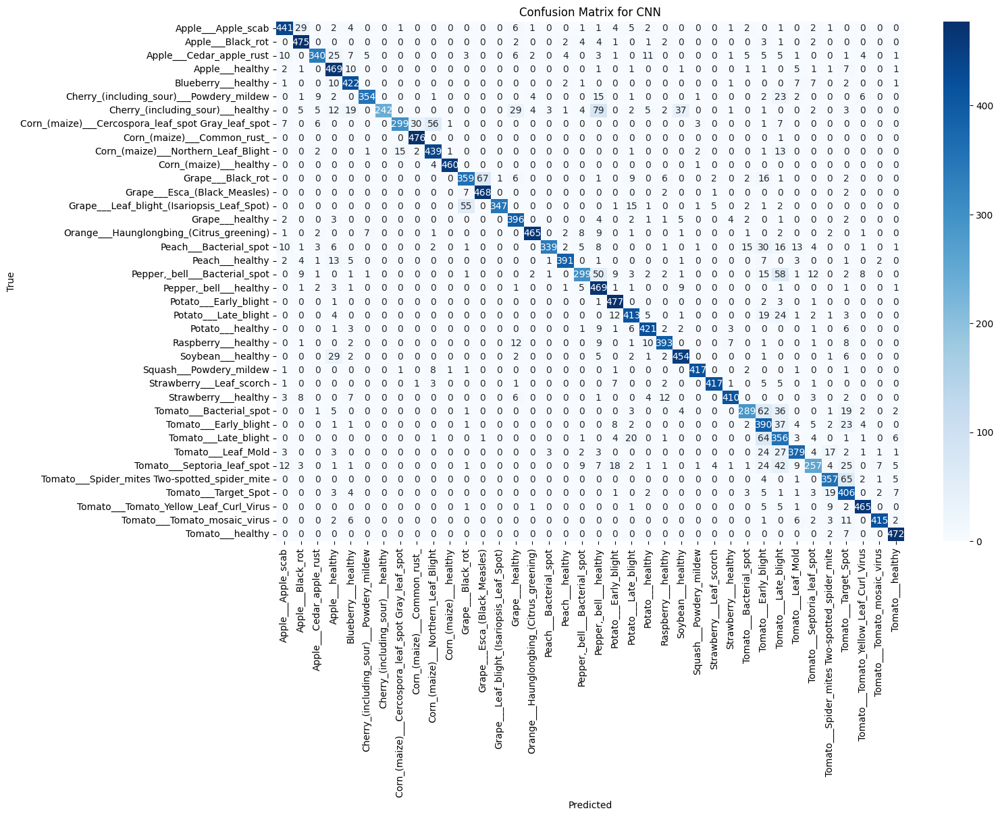

In [17]:
evaluate_model(cnn_model, test_ds, "CNN")

VGG16

In [33]:
import tensorflow
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense,Flatten
from keras.applications.vgg16 import VGG16

# Load Pretrained VGG16 Model
conv_base = VGG16(
    weights='imagenet',
    include_top=False,
    input_shape=(256, 256, 3)
)

# Fine-tuning: Unfreeze block5_conv1 and later layers
conv_base.trainable = True
set_trainable = False

for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    layer.trainable = set_trainable  # Set trainability based on flag

# Model Summary
conv_base.summary()

# Build Model
vggmodel = Sequential([
    conv_base,
    Flatten(),
    Dense(256, activation='relu'),
    Dense(num_classes, activation='softmax')  # Use dynamically computed num_classes
])

# Compile Model
vggmodel.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),  # Lower LR for fine-tuning
    loss='sparse_categorical_crossentropy',  # Use categorical_crossentropy if labels are one-hot
    metrics=['accuracy']
)



Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_12 (InputLayer)          │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 256, 256, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 256, 256, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 128, 128, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 128, 128, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 64, 64, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 64, 64, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 64, 64, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 32, 32, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 32, 32, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 32, 32, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 16, 16, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 8, 8, 512)           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 7,079,424 (27.01 MB)

 Non-trainable params: 7,635,264 (29.13 MB)

In [34]:
# Train Model
vgg_history = vggmodel.fit(train_ds, epochs=10, validation_data=val_ds)

Epoch 1/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 203s 114ms/step - accuracy: 0.6797 - loss: 1.1926 - val_accuracy: 0.9438 - val_loss: 0.1822
Epoch 2/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 198s 113ms/step - accuracy: 0.9588 - loss: 0.1302 - val_accuracy: 0.9601 - val_loss: 0.1242
Epoch 3/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 198s 113ms/step - accuracy: 0.9824 - loss: 0.0582 - val_accuracy: 0.9674 - val_loss: 0.1073
Epoch 4/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 198s 113ms/step - accuracy: 0.9899 - loss: 0.0357 - val_accuracy: 0.9674 - val_loss: 0.1073
Epoch 5/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 198s 113ms/step - accuracy: 0.9955 - loss: 0.0190 - val_accuracy: 0.9698 - val_loss: 0.0963
Epoch 6/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 198s 113ms/step - accuracy: 0.9948 - loss: 0.0183 - val_accuracy: 0.9736 - val_loss: 0.0869
Epoch 7/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 198s 113ms/step - accuracy: 0.9965 - loss: 0.0137 - val_accuracy: 0.9752 - val_loss: 0.0856
Epoch 8/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 198s 113ms/step - ac

Classification Report for VGG:
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       0.98      0.97      0.98       504
                                 Apple___Black_rot       0.98      1.00      0.99       497
                          Apple___Cedar_apple_rust       0.99      0.99      0.99       440
                                   Apple___healthy       0.99      0.98      0.99       502
                               Blueberry___healthy       1.00      0.99      0.99       454
          Cherry_(including_sour)___Powdery_mildew       0.99      1.00      1.00       421
                 Cherry_(including_sour)___healthy       1.00      0.98      0.99       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.96      0.93      0.94       410
                       Corn_(maize)___Common_rust_       1.00      1.00      1.00       477
               Corn_(maize)___Northern_Leaf_Bli

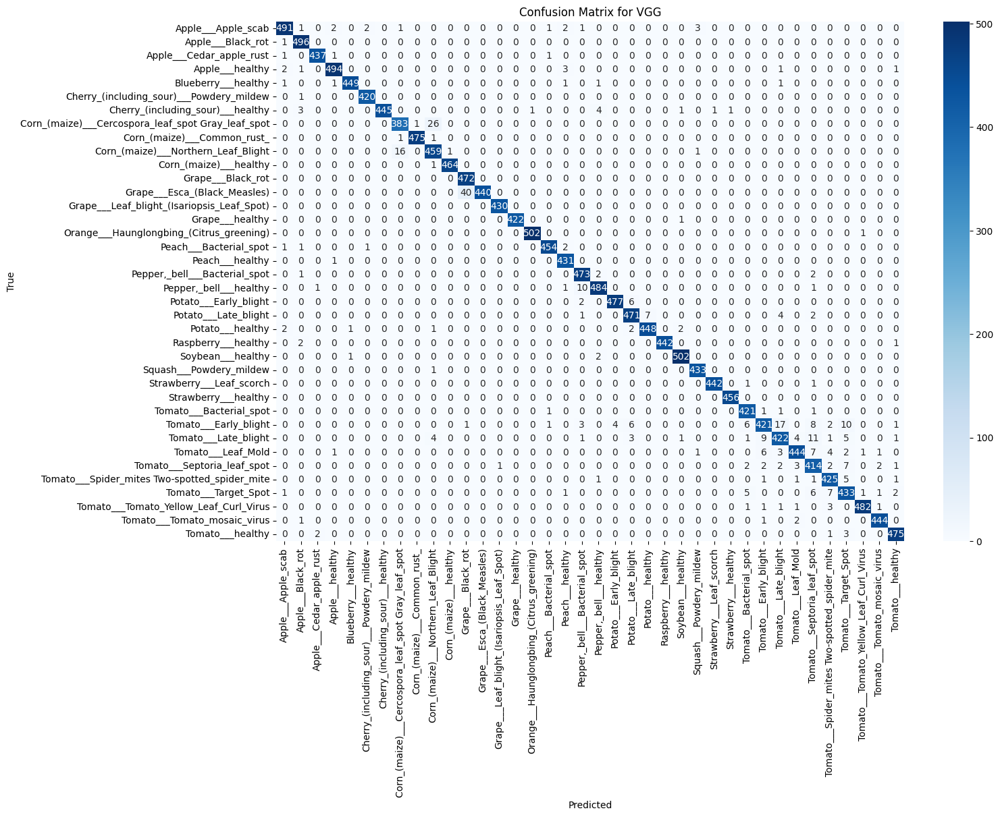

In [42]:
evaluate_model(vggmodel, test_ds, "VGG")

In [27]:
import tensorflow
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense, Flatten
from keras.applications.densenet import DenseNet121

# Load DenseNet121 model (pre-trained on ImageNet)
conv_base = DenseNet121(
    weights='imagenet',
    include_top=False,  # Remove DenseNet121 classifier
    input_shape=(256, 256, 3)
)

# Enable Fine-Tuning for Later Layers
# conv_base.trainable = True
set_trainable = False

for layer in conv_base.layers:
    if layer.name == 'conv5_block1_0_bn':  # Fine-tune from this layer onward
        set_trainable = True
    layer.trainable = set_trainable

# Print trainable layers
for layer in conv_base.layers:
    print(layer.name, layer.trainable)

conv_base.summary()

# Build the Final Model
densenet_model = Sequential([
    conv_base,
    Flatten(),
    Dense(256, activation='relu'),
    Dense(len(class_names), activation='softmax')  # Match the number of classes
])

# Compile Model
densenet_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Train the Model


29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
input_layer_6 False
zero_padding2d False
conv1_conv False
conv1_bn False
conv1_relu False
zero_padding2d_1 False
pool1 False
conv2_block1_0_bn False
conv2_block1_0_relu False
conv2_block1_1_conv False
conv2_block1_1_bn False
conv2_block1_1_relu False
conv2_block1_2_conv False
conv2_block1_concat False
conv2_block2_0_bn False
conv2_block2_0_relu False
conv2_block2_1_conv False
conv2_block2_1_bn False
conv2_block2_1_relu False
conv2_block2_2_conv False
conv2_block2_concat False
conv2_block3_0_bn False
conv2_block3_0_relu False
conv2_block3_1_conv False
conv2_block3_1_bn False
conv2_block3_1_relu False
conv2_block3_2_conv False
conv2_block3_concat False
conv2_block4_0_bn False
conv2_block4_0_relu False
conv2_block4_1_conv False
conv2_block4_1_bn False
conv2_block4_1_relu False
conv2_block4_2_conv False
conv2_block4_concat False
conv2_block5_0_bn False
conv2_block5_0_relu False
conv2_block5_1_conv False
conv2_block5_1_bn False
conv2_block5

Model: "densenet121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 262, 262, 3)    │              0 │ input_layer_6[0][0]    │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 128, 128, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 128, 128, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 128, 128, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 130, 130, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 64, 64, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 64, 64, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 64, 64, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 64, 64, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 64, 64, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 64, 64, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 64, 64, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├──────────────────────

 Total params: 7,037,504 (26.85 MB)

 Trainable params: 2,160,128 (8.24 MB)

 Non-trainable params: 4,877,376 (18.61 MB)

In [28]:
dense_history = densenet_model.fit(train_ds, epochs=10, validation_data=val_ds)

Epoch 1/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 234s 106ms/step - accuracy: 0.7248 - loss: 1.0302 - val_accuracy: 0.9645 - val_loss: 0.1118
Epoch 2/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 166s 95ms/step - accuracy: 0.9783 - loss: 0.0740 - val_accuracy: 0.9754 - val_loss: 0.0777
Epoch 3/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 150s 85ms/step - accuracy: 0.9950 - loss: 0.0232 - val_accuracy: 0.9774 - val_loss: 0.0727
Epoch 4/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 150s 85ms/step - accuracy: 0.9974 - loss: 0.0124 - val_accuracy: 0.9792 - val_loss: 0.0678
Epoch 5/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 150s 85ms/step - accuracy: 0.9977 - loss: 0.0099 - val_accuracy: 0.9792 - val_loss: 0.0698
Epoch 6/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 150s 85ms/step - accuracy: 0.9978 - loss: 0.0084 - val_accuracy: 0.9821 - val_loss: 0.0652
Epoch 7/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 150s 85ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.9818 - val_loss: 0.0672
Epoch 8/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 150s 85ms/step - accuracy:

In [ ]:
# dense_history2 = densenet_model.fit(train_ds, epochs=20, validation_data=val_ds, initial_epoch=10)

Classification Report for DENSE:
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       0.99      0.98      0.99       504
                                 Apple___Black_rot       1.00      1.00      1.00       497
                          Apple___Cedar_apple_rust       0.99      0.99      0.99       440
                                   Apple___healthy       0.99      0.99      0.99       502
                               Blueberry___healthy       0.99      1.00      0.99       454
          Cherry_(including_sour)___Powdery_mildew       1.00      1.00      1.00       421
                 Cherry_(including_sour)___healthy       1.00      1.00      1.00       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.97      0.92      0.94       410
                       Corn_(maize)___Common_rust_       0.99      1.00      0.99       477
               Corn_(maize)___Northern_Leaf_B

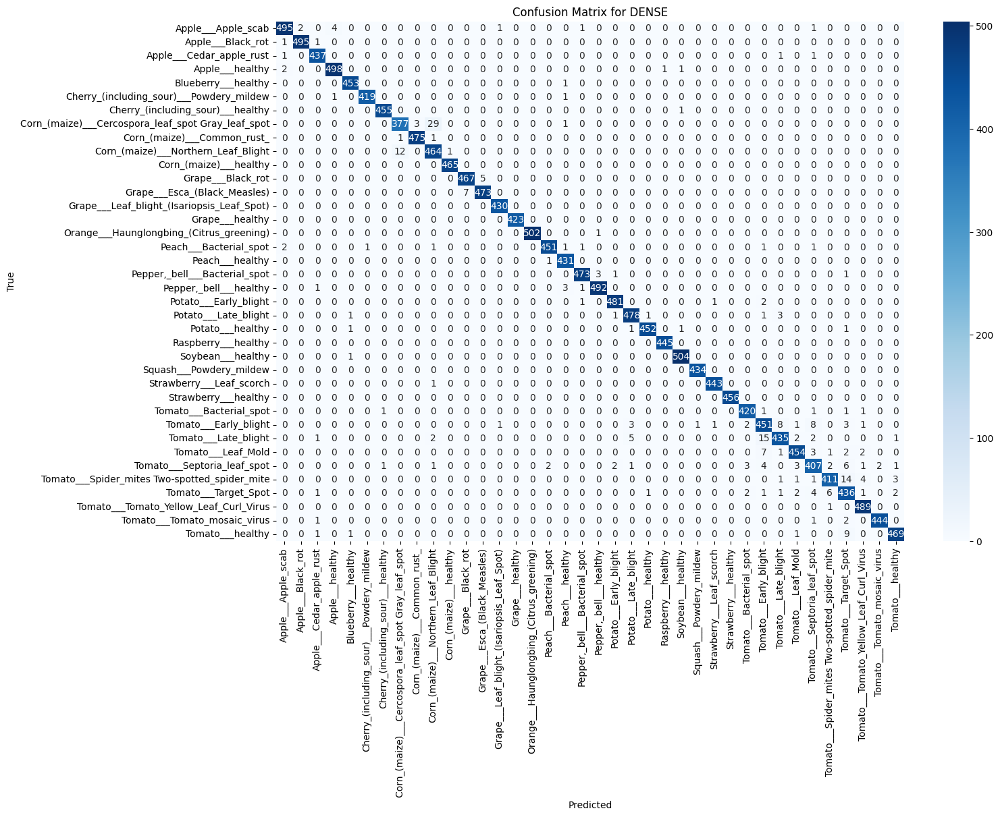

In [29]:
evaluate_model(densenet_model, test_ds, "DENSE")

<ipython-input-43-4405205808cc>:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.02, 1, 0.95])


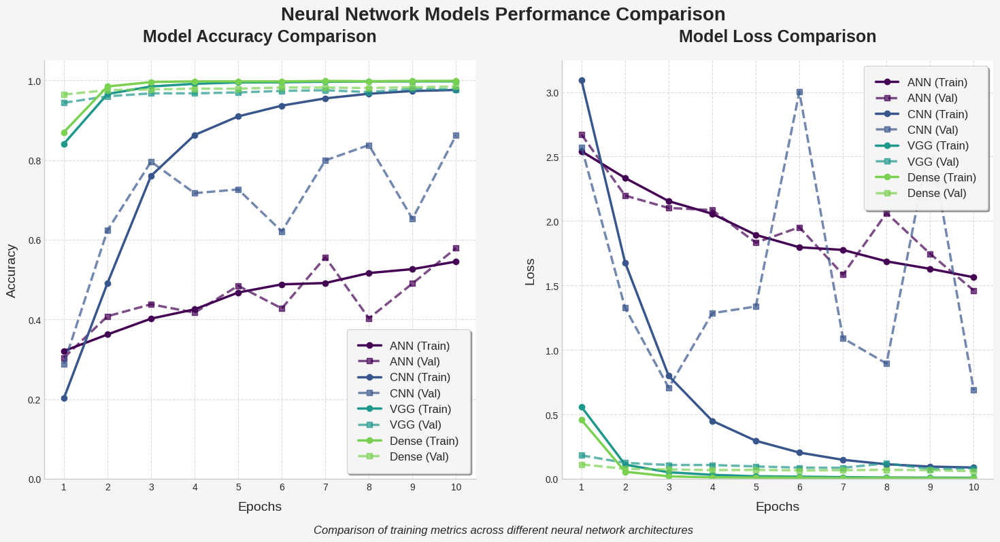

In [43]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.gridspec as gridspec
from matplotlib.ticker import MaxNLocator
import seaborn as sns

# Set the style for better visualization
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")
colors = plt.cm.viridis(np.linspace(0, 0.8, 4))

# Create a figure with two subplots using GridSpec for more control
fig = plt.figure(figsize=(18, 8))
gs = gridspec.GridSpec(1, 2, figure=fig, wspace=0.2)

# Assuming these variables contain training history from different models
# ann_history, cnn_history, vgg_history, dense_history

# Define the epochs (X-axis) - adjust based on your actual training epochs
epochs = range(1, len(ann_history.history['accuracy']) + 1)

# Create a list of model histories and names for easier iteration
models = [
    (ann_history, 'ANN', colors[0]),
    (cnn_history, 'CNN', colors[1]),
    (vgg_history, 'VGG', colors[2]),
    (dense_history, 'Dense', colors[3])
]

# First subplot for accuracy
ax1 = fig.add_subplot(gs[0, 0])
ax1.set_title('Model Accuracy Comparison', fontsize=18, fontweight='bold', pad=20)
ax1.set_xlabel('Epochs', fontsize=14, labelpad=10)
ax1.set_ylabel('Accuracy', fontsize=14, labelpad=10)

# Second subplot for loss
ax2 = fig.add_subplot(gs[0, 1])
ax2.set_title('Model Loss Comparison', fontsize=18, fontweight='bold', pad=20)
ax2.set_xlabel('Epochs', fontsize=14, labelpad=10)
ax2.set_ylabel('Loss', fontsize=14, labelpad=10)

# Plot accuracy and loss for each model
for history, name, color in models:
    # Training metrics
    ax1.plot(epochs, history.history['accuracy'], 
             linestyle='-', linewidth=2.5, marker='o', markersize=6, 
             color=color, label=f'{name} (Train)')
    
    ax2.plot(epochs, history.history['loss'], 
             linestyle='-', linewidth=2.5, marker='o', markersize=6, 
             color=color, label=f'{name} (Train)')
    
    # Validation metrics (if available)
    if 'val_accuracy' in history.history:
        ax1.plot(epochs, history.history['val_accuracy'], 
                 linestyle='--', linewidth=2.5, marker='s', markersize=6, 
                 color=color, alpha=0.7, label=f'{name} (Val)')
        
        ax2.plot(epochs, history.history['val_loss'], 
                 linestyle='--', linewidth=2.5, marker='s', markersize=6, 
                 color=color, alpha=0.7, label=f'{name} (Val)')

# Enhance the accuracy plot
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.set_ylim(0, 1.05)  # Accuracy range from 0 to 1
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))  # Integer ticks
ax1.legend(loc='lower right', fontsize=12, frameon=True, framealpha=0.9,
           shadow=True, borderpad=1)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Enhance the loss plot
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.set_ylim(bottom=0)  # Loss starts from 0
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))  # Integer ticks
ax2.legend(loc='upper right', fontsize=12, frameon=True, framealpha=0.9,
           shadow=True, borderpad=1)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# Add a unique background color to the figure
fig.patch.set_facecolor('#f5f5f5')

# Add overall title for the figure
plt.suptitle('Neural Network Models Performance Comparison', 
             fontsize=20, fontweight='bold', y=0.98)

# Add text annotation for additional information
plt.figtext(0.5, 0.01, 
            'Comparison of training metrics across different neural network architectures',
            ha='center', fontsize=12, style='italic')

# Adjust layout and display
plt.tight_layout(rect=[0, 0.02, 1, 0.95])
plt.savefig('model_comparison.png', dpi=300, bbox_inches='tight')
plt.show()